### **1.   Lire le fichier "X_train_uptade.csv" et "Y_trainCVw08PX.csv"**

In [2]:
# Importation des librairies
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Chargement des fichiers '="X_train_uptade.csv" et "Y_trainCVw08PX.csv"
X_train = pd.read_csv('../../../../X_train.csv', index_col=0)
y_train = pd.read_csv('../../../../Y_train.csv', index_col=0)

# Afficher le nombre de lignes et de colonnes de chacun des deux fichiers
print("Le nombre de lignes et de colonnes de X_train est de :",X_train.shape,
      "\nLe nombre de lignes et de colonnes de y_train est de :", y_train.shape)

Le nombre de lignes et de colonnes de X_train est de : (84916, 4) 
Le nombre de lignes et de colonnes de y_train est de : (84916, 1)


### **2.   Fusion des fichiers "X_train_uptade.csv" et "Y_trainCVw08PX.csv"**




In [3]:
# Fusion avec merge des deux datasets
df = pd.merge(X_train, y_train, left_index=True, right_index=True)

### **3.   Afficher un aperçu des 10 premières lignes**






In [4]:
# Affichage des 5 premières lignes
display(df.head())

# Affichage des 5 dernières lignes
display(df.tail())


,designation,description,productid,imageid,prdtypecode
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237,2280
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,1280
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705


,designation,description,productid,imageid,prdtypecode
84911,The Sims [ Import Anglais ],NaN,206719094,941495734,40
84912,Kit piscine acier NEVADA déco pierre Ø 3.50m x...,<b>Description complète :</b><br />Kit piscine...,3065095706,1188462883,2583
84913,Journal Officiel De La Republique Francaise N°...,NaN,440707564,1009325617,2280
84914,Table Basse Bois De Récupération Massif Base B...,<p>Cette table basse a un design unique et con...,3942400296,1267353403,1560
84915,Gomme De Collection 2 Gommes Pinguin Glace Ver...,NaN,57203227,684671297,2522


### **4.   Description des variables descriptives et de la variable cible**

In [5]:
# Description du dataset
df.info()


# Vérifions si les colonnes de type "object" sont des chaînes de caractères
for col in df.columns:
    if df[col].dtype == 'object':
        if df[col].apply(lambda x: isinstance(x, str)).all():
            print(f"La colonne {col} est bien une chaîne de caractères.")
        else:
            print(f"La colonne {col} contient des éléments qui ne sont pas des chaînes de caractères.")

# Statistiques descriptives de base pour les variables quantitatives
display(df.describe())
## Les statistiques descriptives ne semblent pas pertinentes pour les id, les minima et maxima peuvent donnés une idée de la plage
# Détermination des valeurs minimales et maximales des colonnes de type int64
min_max_values = {}
for col in df.select_dtypes(include='int64').columns:
    min_val = df[col].min()
    max_val = df[col].max()
    min_max_values[col] = (min_val, max_val)

print("Les minima et maxima des colonnes id sont les suivan :", min_max_values)


<class 'pandas.core.frame.DataFrame'>
Index: 84916 entries, 0 to 84915
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   designation  84916 non-null  object
 1   description  55116 non-null  object
 2   productid    84916 non-null  int64 
 3   imageid      84916 non-null  int64 
 4   prdtypecode  84916 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 5.9+ MB
La colonne designation est bien une chaîne de caractères.
La colonne description contient des éléments qui ne sont pas des chaînes de caractères.


,productid,imageid,prdtypecode
count,8.491600e+04,8.491600e+04,84916.000000
mean,2.555468e+09,1.152691e+09,1773.219900
std,1.588656e+09,1.751427e+08,788.179885
min,1.839120e+05,6.728400e+04,10.000000
25%,6.760519e+08,1.056269e+09,1281.000000
50%,3.190506e+09,1.213354e+09,1920.000000
75%,3.995599e+09,1.275646e+09,2522.000000
max,4.252012e+09,1.328824e+09,2905.000000


Les minima et maxima des colonnes id sont les suivants : {'productid': (183912, 4252011632), 'imageid': (67284, 1328824385), 'prdtypecode': (10, 2905)}


### **5.   Recherche des doublons dans chaque colonne**

In [6]:
# Vérifier si les colonnes contiennent des doublons
duplicates = {}
for col in df.columns:
    duplicates[col] = df[col].duplicated().any()

display(duplicates)
#La variables cibles n'est pas à prendre compte car il s'agit de catégories pour les types d'objet
# Il existe des doublons dans les colonnes designation et description alors que les id sont uniques

{'designation': True,
 'description': True,
 'productid': False,
 'imageid': False,
 'prdtypecode': True}

### **5.   Taux et gestion des NAs**



In [7]:
# Affichage du nombre de valeurs manquantes
df.isnull().sum() * 100 / len(df)
# Le taux de NAs est de 35,10% pour la colonne "description"

# Remplacement des valeurs NA de la colonne description par la valeur de désignation
df['description'] = df['description'].fillna(df['designation'])
print(df.isnull().sum() * 100 / len(df)) # Affichage du nombre de valeurs manquantes

# Vérifions si les colonnes de type "object" sont des chaînes de caractères
for col in df.columns:
    if df[col].dtype == 'object':
        if df[col].apply(lambda x: isinstance(x, str)).all():
            print(f"La colonne {col} est bien une chaîne de caractères.")
        else:
            print(f"La colonne {col} contient des éléments qui ne sont pas des chaînes de caractères.")

designation    0.0
description    0.0
productid      0.0
imageid        0.0
prdtypecode    0.0
dtype: float64
La colonne designation est bien une chaîne de caractères.
La colonne description est bien une chaîne de caractères.


### **6.   Définition des valeurs uniques de la colonne prdtypecode**

In [8]:
# Nombre de codes uniques dans la colonne 'prdtypecode'
n_unique_prcode = df['prdtypecode'].nunique()

# Liste des codes uniques
unique_prcodes = df['prdtypecode'].unique()

display(n_unique_prcode, sorted(df['prdtypecode'].unique()))

27

[10,
 40,
 50,
 60,
 1140,
 1160,
 1180,
 1280,
 1281,
 1300,
 1301,
 1302,
 1320,
 1560,
 1920,
 1940,
 2060,
 2220,
 2280,
 2403,
 2462,
 2522,
 2582,
 2583,
 2585,
 2705,
 2905]

### **7.   Tableau df récap'**

In [9]:
# Utilsation de l'extension data_table pour afficher le dataFrame df
df.head()

,designation,description,productid,imageid,prdtypecode
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,Olivia: Personalisiertes Notizbuch / 150 Seite...,3804725264,1263597046,10
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,436067568,1008141237,2280
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,Peluche Donald - Europe - Disneyland 2000 (Mar...,50418756,457047496,1280
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705


### **8.   Graphes de représentation des données**

1.   Élément de liste
2.   Élément de liste



#### **8.1   Histogrammes**

C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


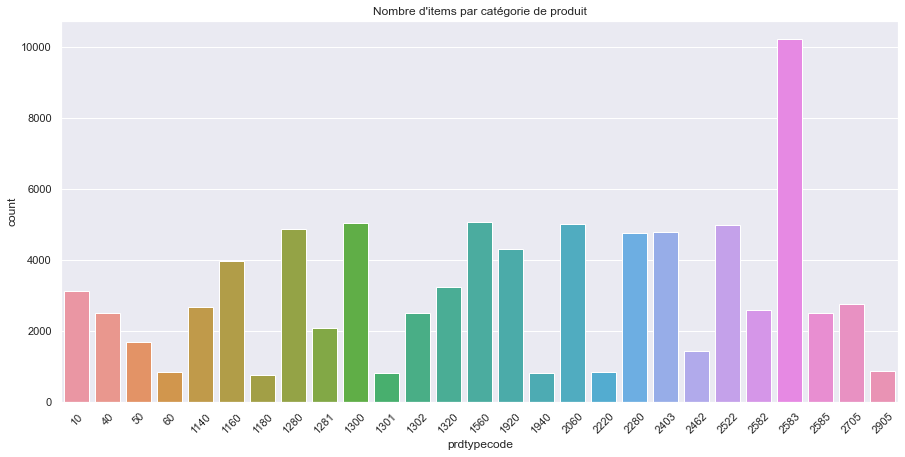

In [10]:
# Importation les packages numpy, pandas et matplotlib.pyplot
import matplotlib.pyplot as plt
%matplotlib inline
# Importation de la librairie seaborn as sns
import seaborn as sns
# Définition du style de seaborn
sns.set_theme(style='darkgrid', palette='deep')

# Définition des dimensions de la figure
fig = plt.figure(figsize = (15,7))
# Affichage de l'histogramme de la variable prdtypecode de df
sns.countplot(x="prdtypecode",data = df)
plt.xticks(rotation = 45)
plt.title("Nombre d'items par catégorie de produit")
plt.show()



```
# Ce texte est au format code
```

#### **8.2   Boîtes à moustaches**

C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


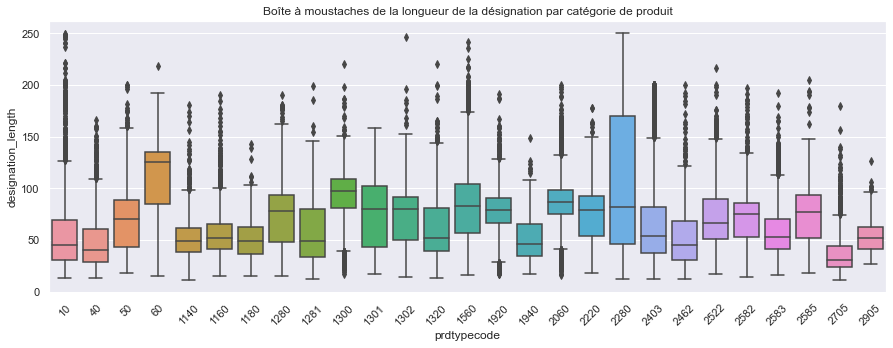

C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\tgp\AppData\Roaming\Python\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


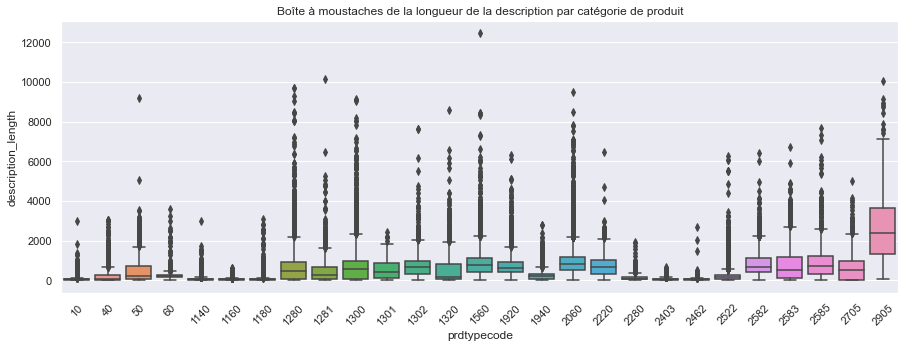

In [11]:
# Calculer la longueur des désignations et des descriptions
df['designation_length'] = df['designation'].apply(lambda x: len(str(x)))
df['description_length'] = df['description'].apply(lambda x: len(str(x)))

# Diagramme en boîte de la longueur des désignations par catégorie de produit
plt.figure(figsize=(15, 5))
sns.boxplot(x='prdtypecode', y='designation_length', data=df)
plt.title('Boîte à moustaches de la longueur de la désignation par catégorie de produit')
plt.xticks(rotation=45)
plt.show()

# Diagramme en boîte de la longueur des descriptions par catégorie de produit
plt.figure(figsize=(15, 5))
sns.boxplot(x='prdtypecode', y='description_length', data=df)
plt.title('Boîte à moustaches de la longueur de la description par catégorie de produit')
plt.xticks(rotation=45)
plt.show()

#### **8.3   WordCloud**

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\tgp\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tgp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\tgp\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


ValueError: Only supported for TrueType fonts

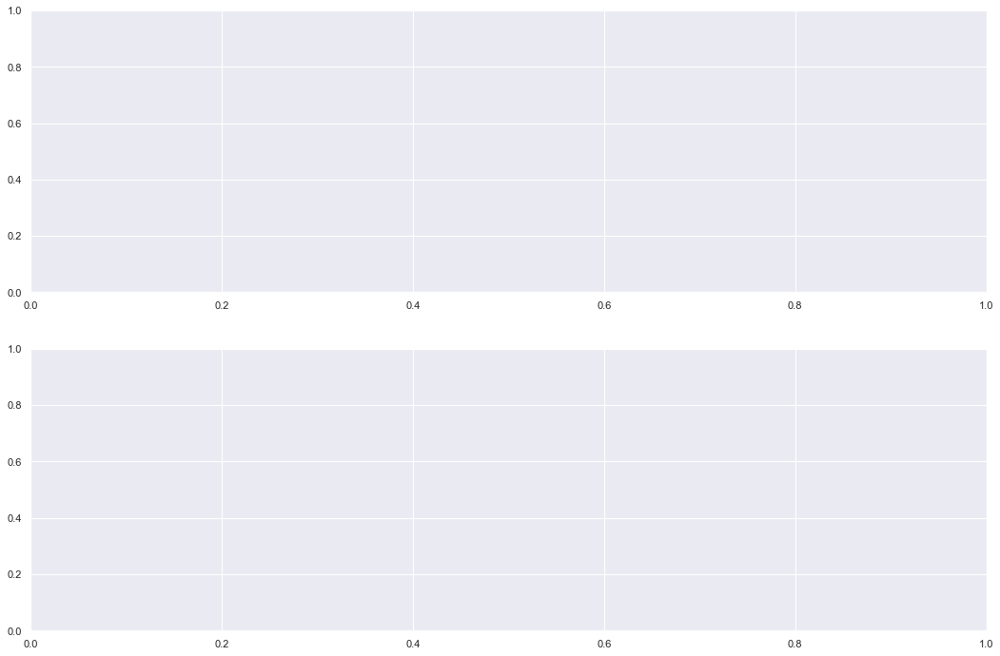

In [12]:
# Importation de la librairie worcloud et de la fonction WordCloud
from wordcloud import WordCloud

# Suggestions de la gestion des erreurs de Python (Google Colab)
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import re

# Fonction pour le prétraitement du texte
def preprocess_text(text):
    # Convertir en minuscules
    text = text.lower()
    # Supprimer les caractères spéciaux et les chiffres
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Tokenisation
    words = word_tokenize(text)
    # Créer une liste de stopwords en français
    stopwords_french = stopwords.words('french')
    # Ajouter "X" et "x" à la liste de stopwords
    stopwords_french.extend(["Ap.", "Apr.", "GHz", "MHz", "USD", "a", "afin", "ah", "ai", "aie", "aient", "aies", "ait", "alors", "après", "as", "attendu",
                             "au", "au-delà", "au-devant", "aucun", "aucune", "audit", "auprès", "auquel", "aura", "aurai", "auraient", "aurais", "aurait",
                             "auras", "aurez", "auriez", "aurions", "aurons", "auront", "aussi", "autour", "autre", "autres", "autrui", "aux", "auxdites", "auxdits",
                             "auxquelles", "auxquels", "avaient", "avais", "avait", "avant", "avec", "avez", "aviez", "avions", "avons", "ayant", "ayez", "ayons", "b",
                             "bah", "banco", "ben", "bien", "bé", "c", "c'", "c'est", "c'était", "car", "ce", "ceci", "cela", "celle", "celle-ci", "celle-là", "celles",
                             "celles-ci", "celles-là", "celui", "celui-ci", "celui-là", "celà", "cent", "cents", "cependant", "certain", "certaine", "certaines", "certains",
                             "ces", "cet", "cette", "ceux", "ceux-ci", "ceux-là", "cf.", "cg", "cgr", "chacun", "chacune", "chaque", "chez", "ci", "cinq", "cinquante", "cinquante-cinq",
                             "cinquante-deux", "cinquante-et-un", "cinquante-huit", "cinquante-neuf", "cinquante-quatre", "cinquante-sept", "cinquante-six", "cinquante-trois", "cl", "cm",
                             "cm²", "comme", "contre", "d", "d'", "d'après", "d'un", "d'une", "dans", "de", "depuis", "derrière", "des", "desdites", "desdits", "desquelles", "desquels",
                             "deux", "devant", "devers", "dg", "différentes", "différents", "divers", "diverses", "dix", "dix-huit", "dix-neuf", "dix-sept", "dl", "dm", "donc", "dont",
                             "douze", "du", "dudit", "duquel", "durant", "dès", "déjà", "e", "eh", "elle", "elles", "en", "en-dehors", "encore", "enfin", "entre", "envers", "es", "est",
                             "et", "eu", "eue", "eues", "euh", "eurent", "eus", "eusse", "eussent", "eusses", "eussiez", "eussions", "eut", "eux", "eûmes", "eût", "eûtes", "f", "fait", "fi",
                             "flac", "fors", "furent", "fus", "fusse", "fussent", "fusses", "fussiez", "fussions", "fut", "fûmes", "fût", "fûtes", "g", "gr", "h", "ha", "han", "hein", "hem",
                             "heu", "hg", "hl", "hm", "hm³", "holà", "hop", "hormis", "hors", "huit", "hum", "hé", "i", "ici", "il", "ils", "j", "j'", "j'ai", "j'avais", "j'étais", "jamais",
                             "je", "jusqu'", "jusqu'au", "jusqu'aux", "jusqu'à", "jusque", "k", "kg", "km", "km²", "l", "l'", "l'autre", "l'on", "l'un", "l'une", "la", "laquelle", "le", "lequel",
                             "les", "lesquelles", "lesquels", "leur", "leurs", "lez", "lors", "lorsqu'", "lorsque", "lui", "lès", "m", "m'", "ma", "maint", "mainte", "maintes", "maints", "mais",
                             "malgré", "me", "mes", "mg", "mgr", "mil", "mille", "milliards", "millions", "ml", "mm", "mm²", "moi", "moins", "mon", "moyennant", "mt", "m²", "m³", "même", "mêmes",
                             "n", "n'avait", "n'y", "ne", "neuf", "ni", "non", "nonante", "nonobstant", "nos", "notre", "nous", "nul", "nulle", "nº", "néanmoins", "o", "octante", "oh", "on", "ont",
                             "onze", "or", "ou", "outre", "où", "p", "par", "par-delà", "parbleu", "parce", "parmi", "pas", "passé", "pendant", "personne", "peu", "plus", "plus_d'un", "plus_d'une",
                             "plusieurs", "pour", "pourquoi", "pourtant", "pourvu", "près", "puisqu'", "puisque", "q", "qu", "qu'", "qu'elle", "qu'elles", "qu'il", "qu'ils", "qu'on", "quand", "quant",
                             "quarante", "quarante-cinq", "quarante-deux", "quarante-et-un", "quarante-huit", "quarante-neuf", "quarante-quatre", "quarante-sept", "quarante-six", "quarante-trois", "quatorze",
                             "quatre", "quatre-vingt", "quatre-vingt-cinq", "quatre-vingt-deux", "quatre-vingt-dix", "quatre-vingt-dix-huit", "quatre-vingt-dix-neuf", "quatre-vingt-dix-sept", "quatre-vingt-douze",
                             "quatre-vingt-huit", "quatre-vingt-neuf", "quatre-vingt-onze", "quatre-vingt-quatorze", "quatre-vingt-quatre", "quatre-vingt-quinze", "quatre-vingt-seize", "quatre-vingt-sept",
                             "quatre-vingt-six", "quatre-vingt-treize", "quatre-vingt-trois", "quatre-vingt-un", "quatre-vingt-une", "quatre-vingts", "que", "quel", "quelle", "quelles", "quelqu'", "quelqu'un",
                             "quelqu'une", "quelque", "quelques", "quelques-unes", "quelques-uns", "quels", "qui", "quiconque", "quinze", "quoi", "quoiqu'", "quoique", "r", "revoici", "revoilà", "rien", "s", "s'",
                             "sa", "sans", "sauf", "se", "seize", "selon", "sept", "septante", "sera", "serai", "seraient", "serais", "serait", "seras", "serez", "seriez", "serions", "serons", "seront", "ses", "si",
                             "sinon", "six", "soi", "soient", "sois", "soit", "soixante", "soixante-cinq", "soixante-deux", "soixante-dix", "soixante-dix-huit", "soixante-dix-neuf", "soixante-dix-sept", "soixante-douze",
                             "soixante-et-onze", "soixante-et-un", "soixante-et-une", "soixante-huit", "soixante-neuf", "soixante-quatorze", "soixante-quatre", "soixante-quinze", "soixante-seize", "soixante-sept",
                             "soixante-six", "soixante-treize", "soixante-trois", "sommes", "son", "sont", "sous", "soyez", "soyons", "suis", "suite", "sur", "sus", "t", "t'", "ta", "tacatac", "tandis", "te", "tel",
                             "telle", "telles", "tels", "tes", "toi", "ton", "toujours", "tous", "tout", "toute", "toutefois", "toutes", "treize", "trente", "trente-cinq", "trente-deux", "trente-et-un", "trente-huit",
                             "trente-neuf", "trente-quatre", "trente-sept", "trente-six", "trente-trois", "trois", "très", "tu", "u", "un", "une", "unes", "uns", "v", "vers", "via", "vingt", "vingt-cinq", "vingt-deux",
                             "vingt-huit", "vingt-neuf", "vingt-quatre", "vingt-sept", "vingt-six", "vingt-trois", "vis-à-vis", "voici", "voilà", "vos", "votre", "vous", "w", "x", "y", "z", "zéro", "à", "ç'", "ça", "ès",
                             "étaient", "étais", "était", "étant", "étiez", "étions", "été", "étée", "étées", "étés", "êtes", "être", "ô"])
    # Supprimer les stopwords
    words = [word for word in words if word not in stopwords_french]
    # Lemmatisation
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(words)

# Prétraiter les colonnes 'designation' et 'description'
df['designation_preprocessed'] = df['designation'].apply(preprocess_text)
df['description_preprocessed'] = df['description'].apply(preprocess_text)

# Fonction pour créer un nuage de mots
def plot_wordcloud(text, ax, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title)

# Créer des nuages de mots pour 'designation' et 'description'
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(18, 12))

# Nuage de mots pour 'designation' (ensemble des données)
plot_wordcloud(' '.join(df['designation_preprocessed']), axes[0], 'Word Cloud for Designation')

# Nuage de mots pour 'description' (ensemble des données)
plot_wordcloud(' '.join(df['description_preprocessed']), axes[1], 'Word Cloud for Description')

plt.tight_layout()
plt.show()

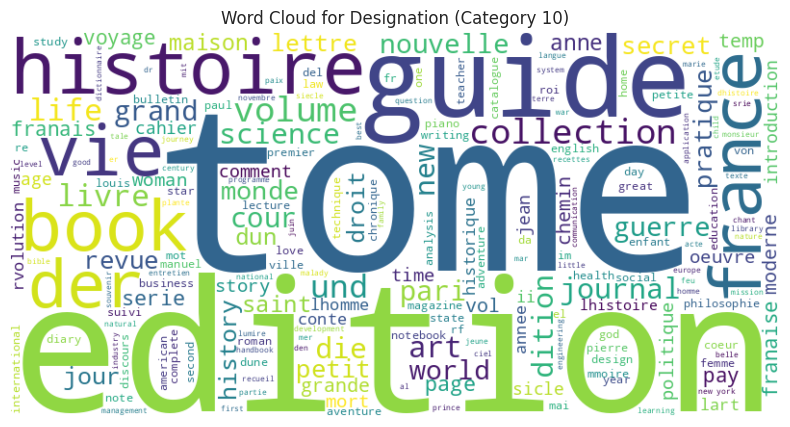

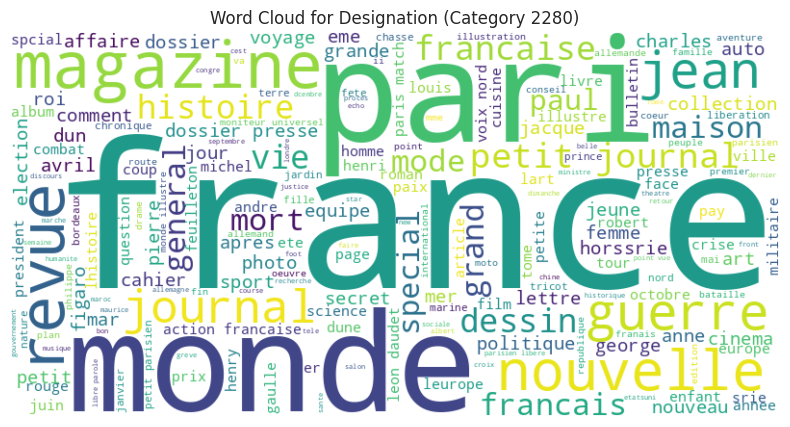

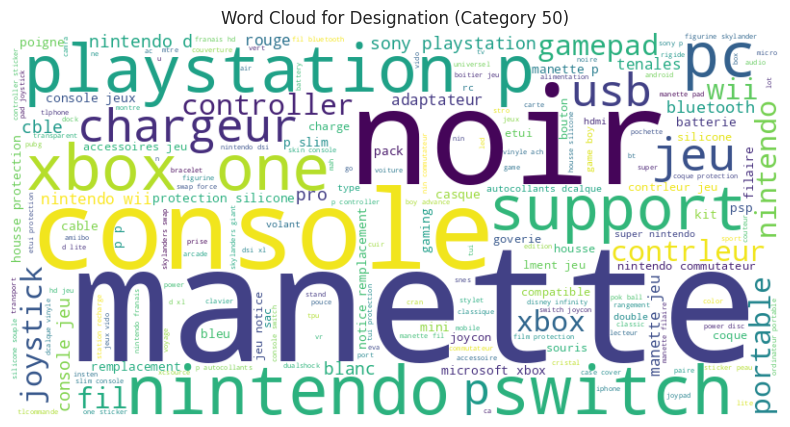

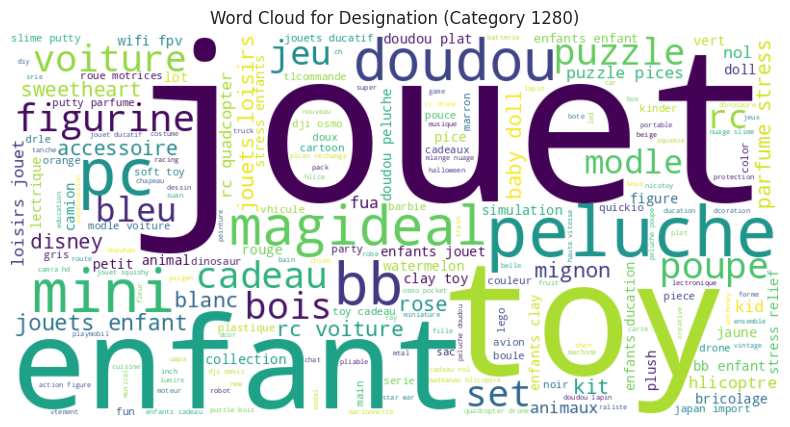

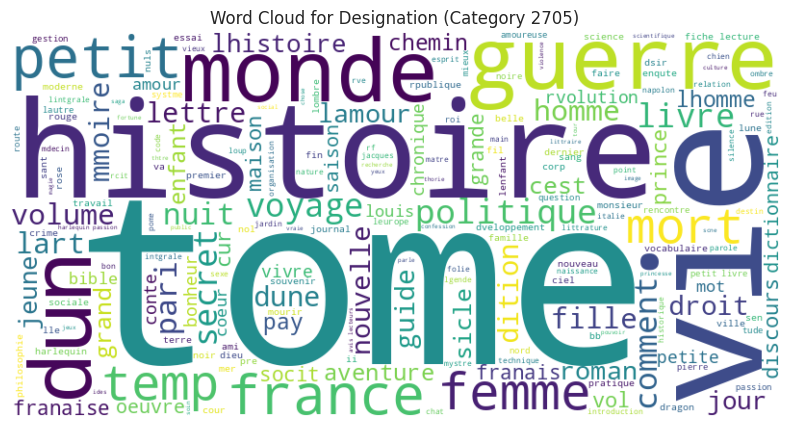

...

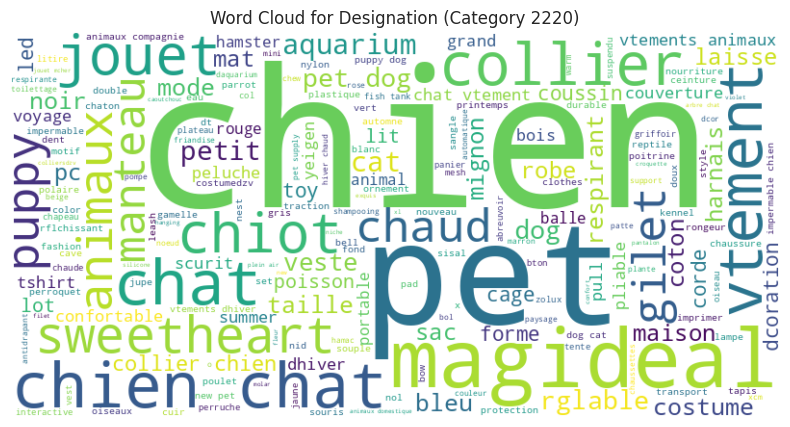

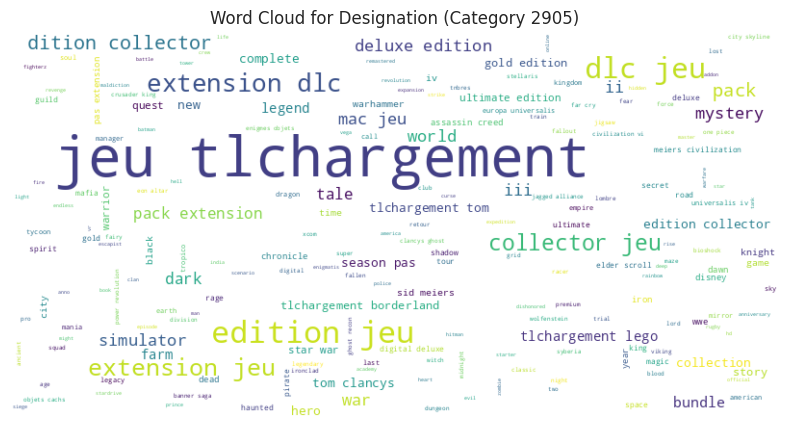

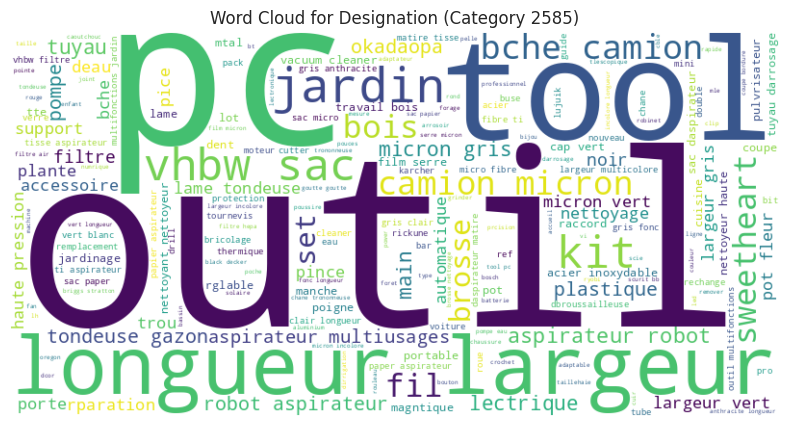

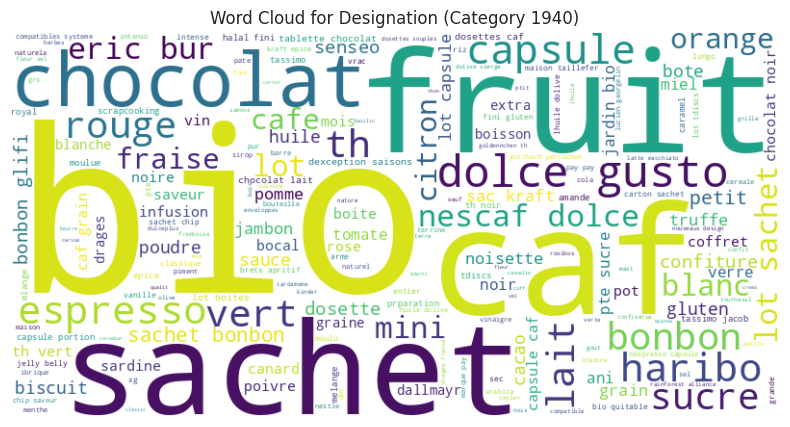

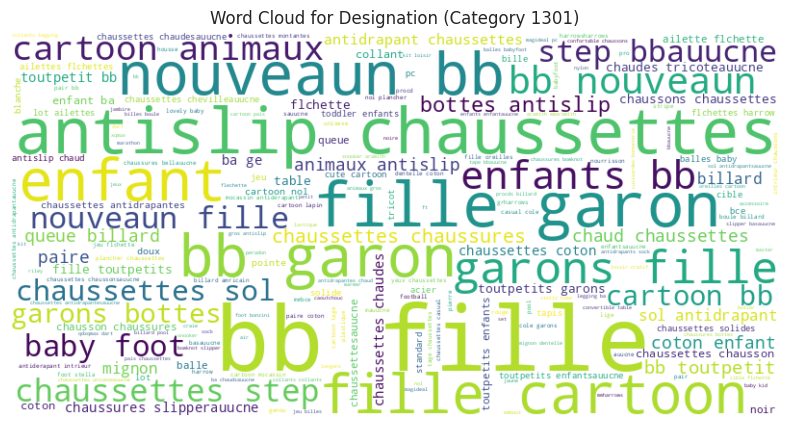

In [ ]:
# Créer des nuages de mots pour chaque catégorie
categories = df['prdtypecode'].unique()
for category in categories:
    category_data = df[df['prdtypecode'] == category]

    # Nuage de mots pour 'designation' par catégorie
    fig, ax = plt.subplots(figsize=(10, 5))
    plot_wordcloud(' '.join(category_data['designation_preprocessed']), ax, f'Word Cloud for Designation (Category {category})')
    plt.show()

    # # Nuage de mots pour 'description' par catégorie
    # fig, ax = plt.subplots(figsize=(10, 5))
    # plot_wordcloud(' '.join(category_data['description_preprocessed']), ax, f'Word Cloud for Description (Category {category})')
    # plt.show()